### Introduction to Nonlinear Dynamics HW1: Pratik Aghor
### Dynamics of the logistic map

In [1]:
using LinearAlgebra
using Plots
using NLsolve

┌ Info: Recompiling stale cache file /home/aghor/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1190
┌ Info: Recompiling stale cache file /home/aghor/.julia/compiled/v1.0/NLsolve/KFCNP.ji for NLsolve [2774e3e8-f4cf-5e23-947b-6d7e65073b56]
└ @ Base loading.jl:1190


In [2]:
f(r, x) = r*x*(1-x)

f (generic function with 1 method)

In [3]:
# iterate f n times, given an initial condition x0
function fIter(f, r, x0, nIter)
    xt = zeros(nIter+1)
    for i = 1:nIter+1
        xt[i] = x0
        # print(f(r, x0), '\n')
        # update for iteration
        x0 = f(r, x0)
    end
    return xt
end

fIter (generic function with 1 method)

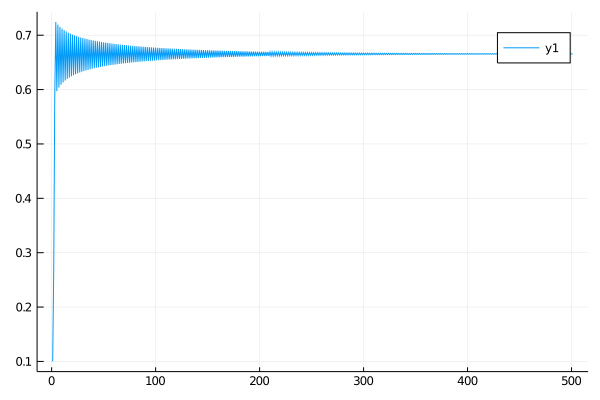

In [4]:
xt = fIter(f, 2.99, 0.1, 500)
plot(xt)

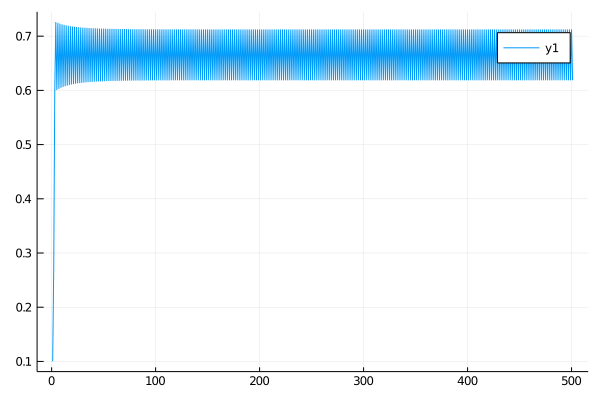

In [5]:
xt = fIter(f, 3.02, 0.1, 500)
plot(xt)

## Q1. Orbit diagram of the logistic map

In [6]:
function plot_orbit_diagram(r_vec)
    nItermax = 1000 # max nIter
    n0 = 40 # plot only last n0 points, to filter transients
    nr = size(r_vec)[1]
    # passed r_vec as an input arg to avoid defining it again and again in the main
    # r_vec = LinRange(0, 4, nr) # define parameter values of r
    scatter([minimum(r_vec)], color=:black, label="", markersize=0.1) # initialize
    one_array = ones(nItermax)
    for i=1:nr
        r = r_vec[i]
        xt = fIter(f, r, 0.1, nItermax)
        scatter!(r*one_array[nItermax-n0:nItermax], xt[nItermax-n0:nItermax], markershape=:circle, markercolor=:black, markerstrokewidth=0, markersize=0.1, label="")
    end
    plot!(xlabel="r",ylabel="x", xlims=(0,4), title="Orbit diagram of the logistic map")

end

plot_orbit_diagram (generic function with 1 method)

In [7]:
Nr = 1000
r_vec = LinRange(0, 4, Nr);
plot_orbit_diagram(r_vec)

In [8]:
# find the index of an element closest to a given value (val) in an array (x)
function findnearest(x, val)
    ibest = 1
    dxbest = abs(x[ibest]-val)
    for i in eachindex(x)
        dx = abs(x[i]-val)
        if dx < dxbest
            dxbest = dx
            ibest = i
        end
    end
    
    return ibest
end 

findnearest (generic function with 1 method)

In [9]:
function plot_orbit_envelopes(r_vec)
    plot_orbit_diagram(r_vec)
    
    nr = size(r_vec)[1]
    x0 = zeros(nr)
    idx1 = findnearest(r_vec, 1)
    idx2 = findnearest(r_vec, 3)
    idx3 = findnearest(r_vec, 1+sqrt(6))
    x1 = ones(nr) - 1 ./r_vec
    
    r_2_orbit = r_vec[idx2+1:end]
    nr2 = size(r_2_orbit)[1]
    xp = ( r_2_orbit + ones(nr2) .+ sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    xq = ( r_2_orbit + ones(nr2) .- sqrt.((r_2_orbit-3*ones(nr2)) .* (r_2_orbit+ones(nr2)) ) ) ./(2 .*r_2_orbit)
    
    plot!(r_vec[1:idx1], x0[1:idx1], color="red", linewidth=2.0, linestyle=:solid, label="x0*")
    plot!(r_vec[idx1:end], x0[idx1:end], color="red", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_vec[idx1:idx2], x1[idx1:idx2], color="blue", linewidth=2.0, linestyle=:solid, label="x1*")
    plot!(r_vec[idx2:end], x1[idx2:end], color="blue", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(r_2_orbit[1:idx3-idx2], xp[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="2-orbit xp, xq")
    plot!(r_2_orbit[idx3-idx2:end], xp[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    plot!(r_2_orbit[1:idx3-idx2], xq[1:idx3-idx2], color="green", linewidth=2.0, linestyle=:solid, label="")
    plot!(r_2_orbit[idx3-idx2:end], xq[idx3-idx2:end], color="green", linewidth=2.0, linestyle=:dash, label="")
    
    plot!(legend=:topleft)
end

plot_orbit_envelopes (generic function with 1 method)

In [10]:
plot_orbit_envelopes(r_vec)

## Q2: Bifurcation and Stability of the $4$-orbit
* In order to find the where the $4$-orbit originates as a bifurcation from the $2$-orbit $\{x_{p}, x_{q}\}$, we must find where the $2$-orbit loses stability. 
* The $2$-orbit becomes unstable where $$|f^{2'}(x)|_{x_{p}} = f'(f(x_{p})) \cdot f'(x_{p}) = |f'(x_{q})\cdot f'(x_{p})| > 1.$$
* Hence in order to find the bifurcation point, we must solve the equation 
$$g(r) \equiv |f'(x_{q}(r))\cdot f'(x_{p}(r))| - 1 = 0.$$
* Since
$$ 
x_{p, q} = \frac{(r+1)\pm \sqrt{(r-3)(r+1)}}{2r}
$$ and $f'(x) = r(1-2x)$, we have, 
$$\begin{align}
    \begin{split}
        g(r) &= r(1-2x_{p}) \cdot r(1-2x_{q}) - 1\\
        0 &= r^{2}(1-2x_{p}) \cdot (1-2x_{q}) -1 \\
        0 &= r^{2}(1 - 2x_{p} - 2x_{q} + 4x_{p}x_{q}) - 1\\
        0 &= r^{2}\left(1 - \frac{2r+2}{r} + \frac{(r+1)^{2}- (r-3)(r+1)}{r^{2}}\right) - 1\\
        0 &= r^{2} - (2r^{2}+2r) + (r+1)\cdot 4\\
        0 &= -r^{2} + 2r + 4\\
        r^{2}-2r - 4 &=0
    \end{split}
\end{align}
$$
* For finding the root directly, we find the intersections of the $4^{th}$ iterate of the logistic map with identity. 

In [11]:
f4(r, x) = f(r, f(r, f(r, f(r, x)))) # 4th iterate of f(r, x)

f4 (generic function with 1 method)

In [12]:
function plotf4(r)
    # define x between 0 and 1
    nx = 100
    mid= Int64(nx/2)
    x = range(0.0, stop=1.01, length=nx)
    y = zeros(nx)
    y = f4.(r, x)
    plot(x, y, color=:blue, linewidth =:2)
    plot!(x, x, color=:red, linestyle =:dash, linewidth=:2)
    plot!(legend=false, xlabel="x",ylabel="f4(x)", xlims=(-0.001,1.1), ylims=(-0.001,1.1))
end

plotf4 (generic function with 1 method)

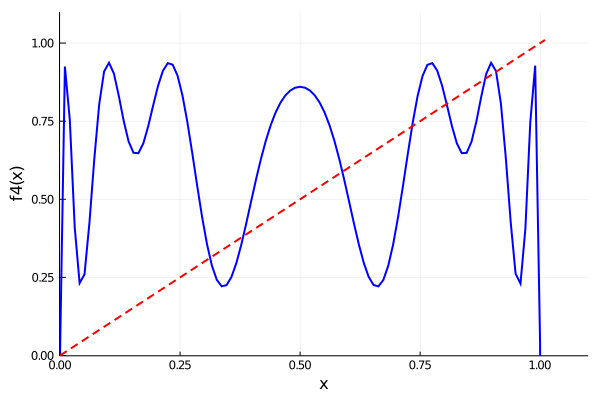

In [13]:
plotf4(1+sqrt(6)+0.3)

In [33]:
# g(x) = F(x) - x, where F(x) is nth iterate of the logistic map. 
# Thus roots of g(x) == 0 are periodic orbits
# NOTE: nsolve takes everything in terms of arrays, so treat x as a 1 x 1 array object, convert to float later
function g!(gx, x, r)
    
    gx[1] = f4(r, x[1]) - x[1]
end

g! (generic function with 2 methods)

In [34]:
xguess = 0.8
r = 1+sqrt(6)+0.3 # value above 1+sqrt(6)
x1 = nlsolve(g!, [xguess])

Results of Nonlinear Solver Algorithm
 * Algorithm: Trust-region with dogleg and autoscaling
 * Starting Point: [0.8]
 * Zero: [0.805234]
 * Inf-norm of residuals: 0.000000
 * Iterations: 3
 * Convergence: true
   * |x - x'| < 0.0e+00: false
   * |f(x)| < 1.0e-08: true
 * Function Calls (f): 4
 * Jacobian Calls (df/dx): 4

In [42]:
x1.zero

1-element Array{Float64,1}:
 0.8052335982102768

In [46]:
a = norm(x1.zero) # trick to convert 1 x 1 array type into float

0.8052335982102768

In [48]:
fIter(f, r, a , 9 ) # check period-4 orbit

10-element Array{Float64,1}:
 0.8052335982102768
 0.5880416645738157
 0.9083088857417846
 0.312271955653675 
 0.8052335982102272
 0.5880416645739293
 0.9083088857417095
 0.3122719556539048
 0.8052335982105507
 0.5880416645731888

In [50]:
orb4 = fIter(f, r, a, 3) # define the points on the 4-orbit

4-element Array{Float64,1}:
 0.8052335982102768
 0.5880416645738157
 0.9083088857417846
 0.312271955653675 

In [53]:
fPrime(r, x) = r*(1-2*x) # define f'(x) = r(1-2x)

fPrime (generic function with 2 methods)

### given an r and an x-orbit, obtain the Floquet multiplier 
$$\Lambda_{p}= \prod_{i=1}^{n} f'(x_{i})$$

In [67]:
function get_floquet_multiplier(fPrime, r, xorb)
    n = size(xorb)[1]
    Lambda_p = 1.
    for i = 1:n
        Lambda_p *= fPrime(r, xorb[i])
    end
    return Lambda_p
end

get_floquet_multiplier (generic function with 1 method)

In [79]:
r = 1+sqrt(6)+0.3 
multiplier = get_floquet_multiplier(fPrime, r, orb4)
@show multiplier
fPrime(r, orb4[4])*fPrime(r, orb4[3])*fPrime(r, orb4[2])*fPrime(r, orb4[1])

multiplier = -6.513992147310959


-6.51399214731096

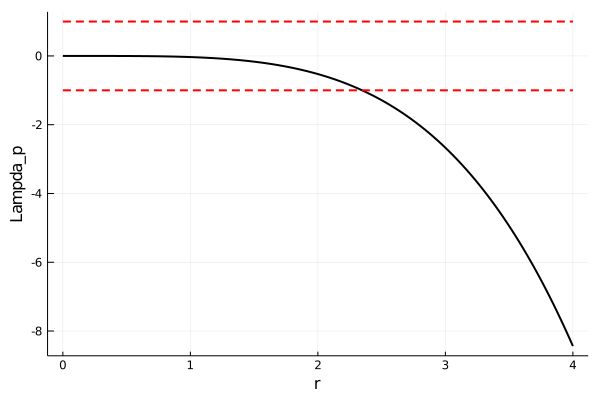

In [78]:
Nr = 1000
r_vec = LinRange(0, 4, Nr);

Lambda_p_array = zeros(Nr)

for i = 1:Nr
    Lambda_p_array[i] = get_floquet_multiplier(fPrime, r_vec[i], orb4)
end
plot(r_vec, Lambda_p_array, color=:black, linewidth =:2, label="")
plot!(r_vec, ones(Nr), color=:red, linestyle=:dash, linewidth =:2, label="")
plot!(r_vec, -ones(Nr), color=:red, linestyle=:dash, linewidth =:2, label="")

plot!(xlabel = "r", ylabel = "Lampda_p")